In [ ]:
from google.colab import files
uploaded = files.upload()

Saving bank-full.csv to bank-full.csv


In [ ]:
!pip install pandas-profiling==2.7.1
!pip install -U dataprep

In [ ]:
!pip install cufflinks
!pip install plotly

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils import resample
import pandas_profiling
# from dataprep.eda import plot
from sklearn import preprocessing
from scipy.stats import kurtosis,skew
from scipy.stats import stats
from scipy.stats import ttest_ind, ttest_1samp, wilcoxon
from statsmodels.stats.power import ttest_power
import plotly as plotly
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
from matplotlib.gridspec import GridSpec
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'colab'

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
dataFrame = pd.read_csv(r'bank-full.csv')
dataFrame = dataFrame.rename(columns={'default': 'cred_defx', 'loan': 'personal_loan', 'contact': 'contact', 'poutcome': 'previous_camp'})
columns = dataFrame.columns

# outcome = dataFrame['target']
# dataFrame = dataFrame.drop(columns=['target'], axis=1, inplace=False)
#outcome
dataFrame.info()
# columns
dataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   age            45211 non-null  int64 
 1   job            45211 non-null  object
 2   marital        45211 non-null  object
 3   education      45211 non-null  object
 4   cred_defx      45211 non-null  object
 5   balance        45211 non-null  int64 
 6   housing        45211 non-null  object
 7   personal_loan  45211 non-null  object
 8   contact        45211 non-null  object
 9   day            45211 non-null  int64 
 10  month          45211 non-null  object
 11  duration       45211 non-null  int64 
 12  campaign       45211 non-null  int64 
 13  pdays          45211 non-null  int64 
 14  previous       45211 non-null  int64 
 15  previous_camp  45211 non-null  object
 16  target         45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


,age,job,marital,education,cred_defx,balance,housing,personal_loan,contact,day,month,duration,campaign,pdays,previous,previous_camp,target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [ ]:
#convert categorical values into int using find and replace method
clean_up_data = {"target": {"yes":1, "no":0}, "previous_campaign": {"unknown": -1, "success":1, "failure":0, "other":-1},
                 "job": {"blue-collar":1, "management": 2,"technician":3, "admin.":4, "services":5, "retired":6, "self-employed":7, "entrepreneur":8, "unemployed":9, "housemaid":10, "student":11, "unknown":-1},
                 "marital": {"married":1, "single":2, "divorced":3}, "education": {"primary":1, "secondary":2, "tertiary":3, "unknown":-1},
                 "credit_default": {"no":0, "yes":1}, "housing": {"no":0, "yes":1}, "personal_loan": {"no":0, "yes":1},
                 "contact_type": {"cellular":1, "telephone":0, "unknown": -1},
                 "month":{"jan":1, "feb":2, "mar":3, "apr":4, "may":5, "jun":6, "jul":7, "aug":8, "sep":9, "oct":10, "nov":11, "dec":12},
                 }
dataFrame.replace(clean_up_data, inplace=True)
dataFrame.head(5)
dataFrame.dtypes

age               int64
job               int64
marital           int64
education         int64
cred_defx        object
balance           int64
housing           int64
personal_loan     int64
contact          object
day               int64
month             int64
duration          int64
campaign          int64
pdays             int64
previous          int64
previous_camp    object
target            int64
dtype: object

Basic Information about the dataset

*   There are 17 coulumns out of which 7 are of type int and the other are object type

*   size is of data is 45211 and there are no null values present







In [ ]:
!pip install dataframe_image

     |████████████████████████████████| 1.3MB 7.0MB/s 
     |████████████████████████████████| 296kB 41.2MB/s 
     |████████████████████████████████| 143kB 40.8MB/s 
  Created wheel for idna-ssl: filename=idna_ssl-1.1.0-cp36-none-any.whl size=3161 sha256=0ba5caea1da4efa75787440409be9b35f27996aa7899e632ae7b2be92170b77e
  Stored in directory: /root/.cache/pip/wheels/d3/00/b3/32d613e19e08a739751dd6bf998cfed277728f8b2127ad4eb7
Successfully built idna-ssl


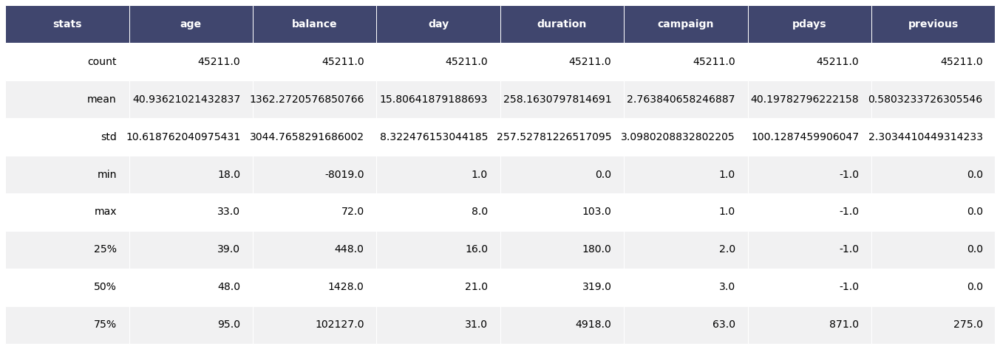

In [ ]:
import dataframe_image as dfi
import six
a = dataFrame.describe()
# test = a.values
# print(test)
# a.export('image.png')
%matplotlib inline
import matplotlib.pyplot as plt
import six

# data_dict = {"stats": ['count', 'mean', 'std', 'min', 'max', '25%', '50%', '75%', 'max' ]}
idx = 0
new_col = ['count', 'mean', 'std', 'min', 'max', '25%', '50%', '75%']  # can be a list, a Series, an array or a scalar   
a.insert(loc=idx, column='stats', value=new_col)
def render_mpl_table(data, col_width=3.0, row_height=0.625, font_size=14,
                     header_color='#40466e', row_colors=['#f1f1f2', 'w'], edge_color='w',
                     bbox=[0, 0, 1, 1], header_columns=0,
                     ax=None, **kwargs):
    if ax is None:
        size = (np.array(data.shape[::-1]) + np.array([0, 1])) * 1.5 * np.array([col_width, row_height])
        fig, ax = plt.subplots(figsize=size)
        ax.axis('off')
    # if dtype is num:

    mpl_table = ax.table(cellText=data.values, bbox=bbox, colLabels=data.columns, **kwargs)

    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(font_size)

    for k, cell in six.iteritems(mpl_table._cells):
        cell.set_edgecolor(edge_color)
        if k[0] == 0 or k[1] < header_columns:
            cell.set_text_props(weight='bold', color='w')
            cell.set_facecolor(header_color)
        else:
            cell.set_facecolor(row_colors[k[0]%len(row_colors) ])
    return ax

render_mpl_table(a, header_columns=0, col_width=2.0)
plt.show()

Below are the observations from the initial data

*   Age of clients range from 18 to 95 years. 50% of the customers are below the age 39 and Average age is 41 years
*   Balance of clients are in between -8019 Euros to 102127 Euros


*   Days varies between 1 and 31
*   Average duration contacted on a whole by the bank employees was 258 sec










# Univariate Analysis of Independent attributes


Check the count of outliers

In [ ]:
#store numeric and object datatypes seperately

dataFrame_numeric = dataFrame.select_dtypes(include=[np.number])
dataFrame_object = dataFrame.select_dtypes(include=[object])
columns = dataFrame_numeric.columns.tolist()

In [ ]:
from prettytable import PrettyTable

def col_outlier_analysis(df, col_name, table):
    q1 = np.quantile(df[col_name],0.25)
    q2 = np.quantile(df[col_name],0.50)
    q3 = np.quantile(df[col_name],0.75)
    IQR = q3-q1
    above_outlier_val = q3 + 1.5*IQR
    below_outlier_val = q1 - 1.5*IQR
    no_above_outlier_val = df[df[col_name]>above_outlier_val][col_name].shape[0]
    no_below_outlier_val = df[df[col_name]<below_outlier_val][col_name].shape[0]
    table.add_row([col_name,IQR,above_outlier_val, below_outlier_val, no_above_outlier_val, no_below_outlier_val])
  
# IQR analysis for all columns.
# Some columns might have 0 outliers or 0 values above outlier or 0 values below outliers

iqr_table1 = PrettyTable()
iqr_table1.field_names = ["Col", "IQR", "q3+1.5IQR", "q1-1.5IQR", "no>outlier_val", "no< outlier_val"]


for col in columns:
    col_outlier_analysis(dataFrame_numeric, col, iqr_table1)

print("IQR analysis for Original Data")
print(iqr_table1)

IQR analysis for Original Data
+-----------+--------+-----------+-----------+----------------+-----------------+
|    Col    |  IQR   | q3+1.5IQR | q1-1.5IQR | no>outlier_val | no< outlier_val |
+-----------+--------+-----------+-----------+----------------+-----------------+
|    age    |  15.0  |    70.5   |    10.5   |      487       |        0        |
|    job    |  3.0   |    9.5    |    -2.5   |      2178      |        0        |
|  marital  |  1.0   |    3.5    |    -0.5   |       0        |        0        |
| education |  1.0   |    4.5    |    0.5    |       0        |       1857      |
|  balance  | 1356.0 |   3462.0  |  -1962.0  |      4712      |        17       |
|  housing  |  1.0   |    2.5    |    -1.5   |       0        |        0        |
|    day    |  13.0  |    40.5   |   -11.5   |       0        |        0        |
|   month   |  3.0   |    12.5   |    0.5    |       0        |        0        |
|  duration | 216.0  |   643.0   |   -221.0  |      3235      |    

Observation:

From the table it is evident that

*   There are more number of outliers, so it depends whether to drop them or not based on the domain knowledge as it might affect the models we are building. But before doing that lets look at them visually



Analysing Data Frame:


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:

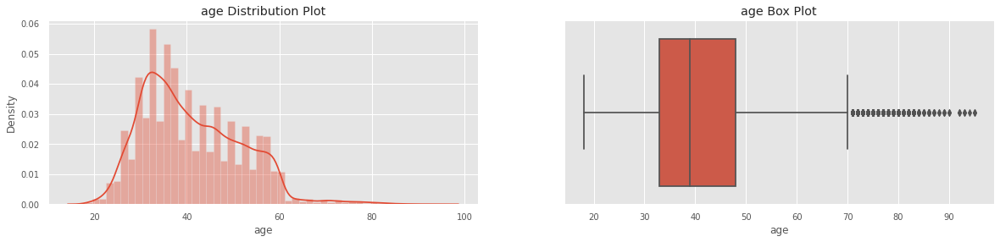

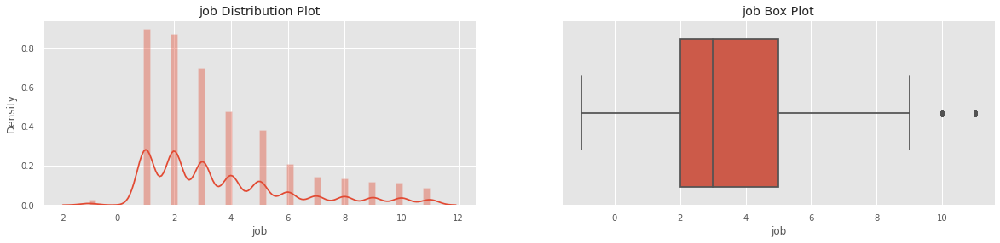

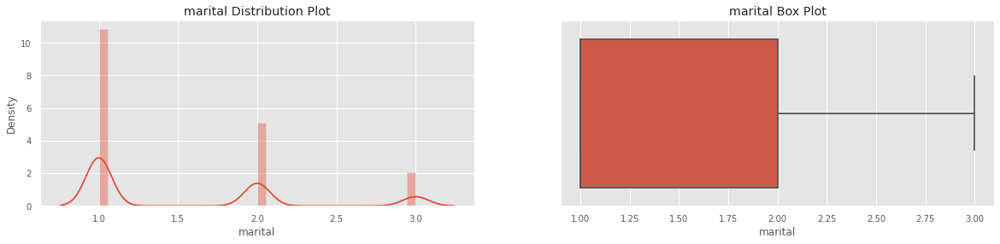

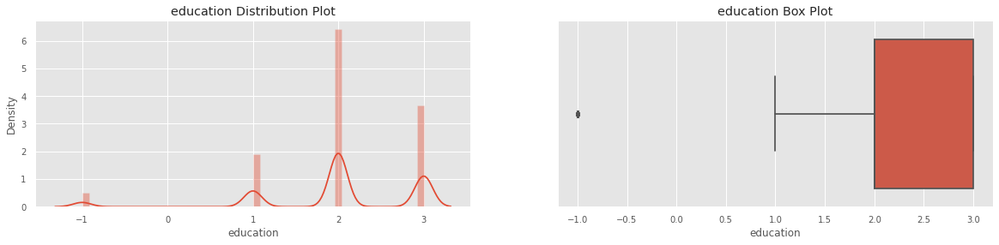

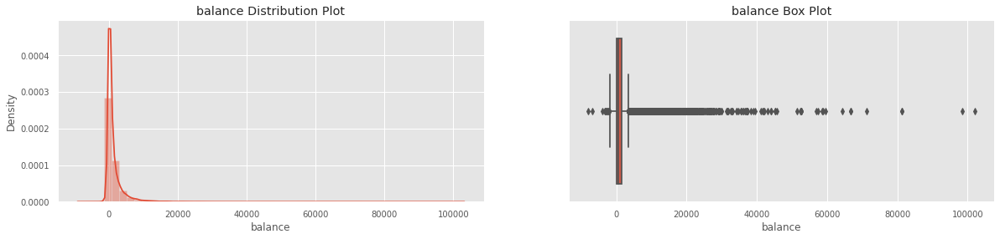

...

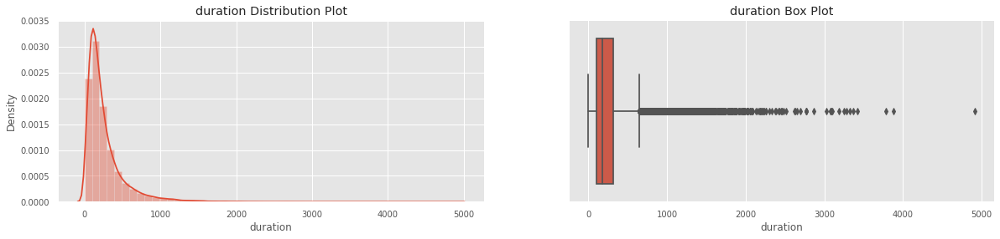

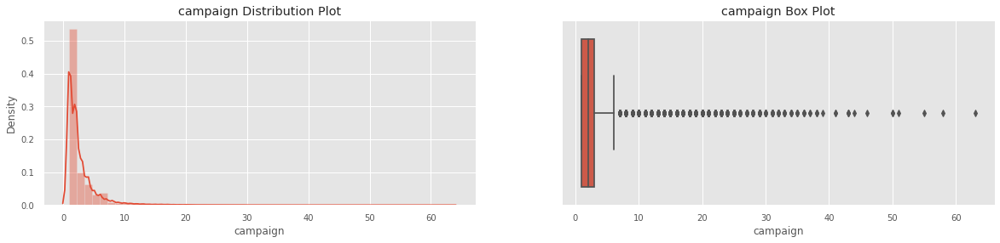

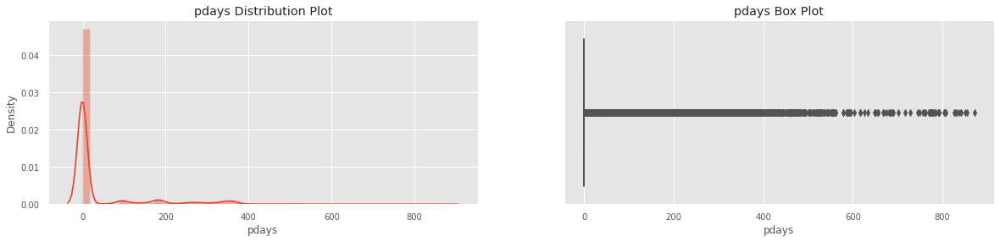

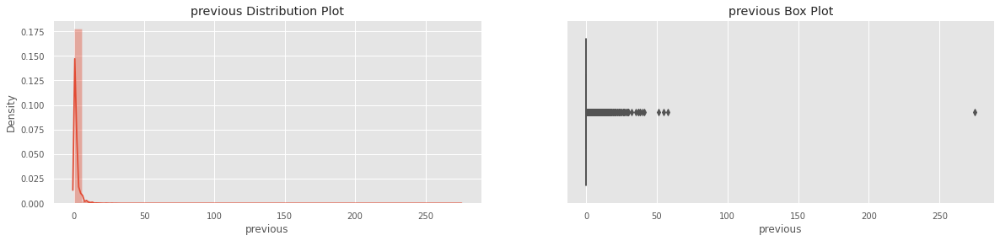

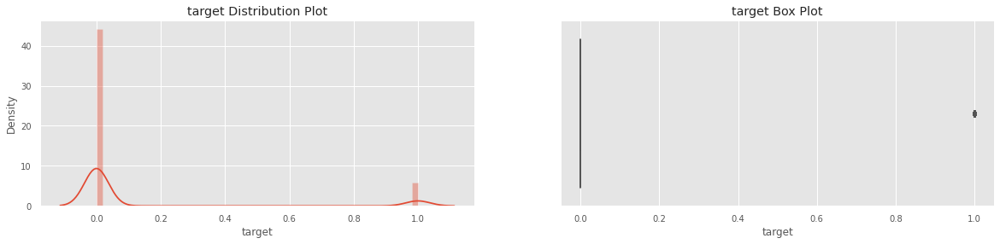

In [ ]:
#convert target variables to 1's and 0's
# target_clean = pd.Series(np.where(dataFrame.target.values =='yes', 1, 0))
# dataFrame ['target'] = target_clean

# Histogram of independent variableS

def plot_columns(df,column_name):
    with plt.style.context('ggplot'):
        fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
        fig.set_size_inches(20,4)
        # Distribution plots
        sns.distplot(df[column_name],ax=ax1)
        ax1.set_title(column_name + " Distribution Plot")
        # Box plots
        sns.boxplot(df[column_name],ax=ax2)
        ax2.set_title(column_name + " Box Plot")

## plot columns for dataframe(df)
print("Analysing Data Frame:")

for col in columns: 
    plot_columns(dataFrame_numeric, col)   

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



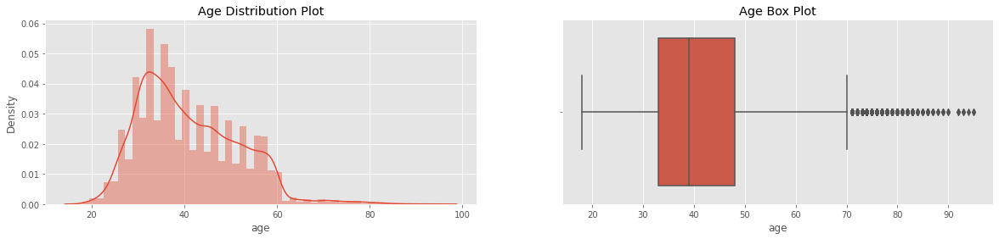

In [ ]:
with plt.style.context('ggplot'):
    fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
    fig.set_size_inches(20,4)
    # Distribution plots
    sns.distplot(dataFrame['age'],ax=ax1)
    ax1.set_title('Age' + " Distribution Plot")
    # Box plots
    sns.boxplot(dataFrame['age'],ax=ax2)
    ax2.set_title('Age' + " Box Plot")

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:

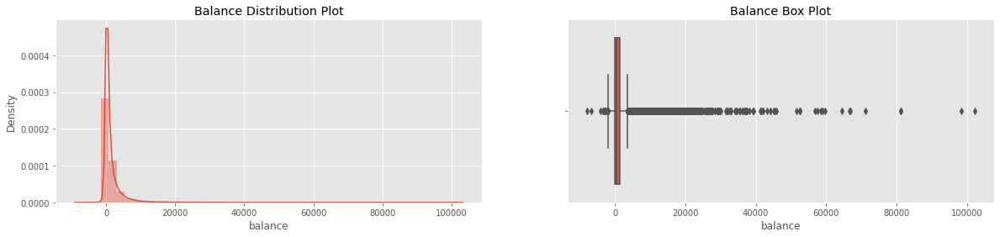

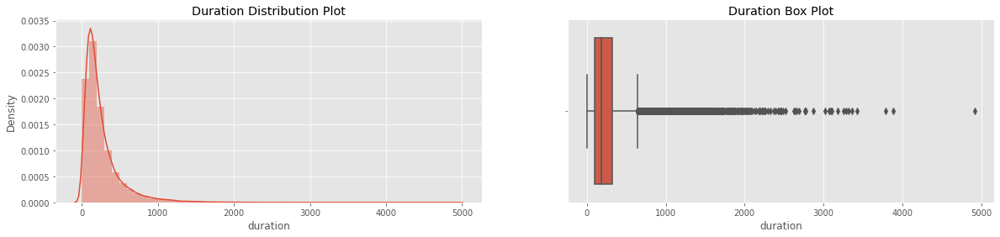

In [ ]:
with plt.style.context('ggplot'):
    fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
    fig.set_size_inches(20,4)
    # Distribution plots
    sns.distplot(dataFrame['balance'],ax=ax1)
    ax1.set_title('Balance' + " Distribution Plot")
    # Box plots
    sns.boxplot(dataFrame['balance'],ax=ax2)
    ax2.set_title('Balance' + " Box Plot")


with plt.style.context('ggplot'):
    fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
    fig.set_size_inches(20,4)
    # Distribution plots
    sns.distplot(dataFrame['duration'],ax=ax1)
    ax1.set_title('Duration' + " Distribution Plot")
    # Box plots
    sns.boxplot(dataFrame['duration'],ax=ax2)
    ax2.set_title('Duration' + " Box Plot")

In [ ]:
#test
# dataFrame_object.target.isnull().sum()

# dataFrame_numeric.plot.bar(stacked=True)

Observations

*   From the plot, Balance attribute says that there are more number of customers whose values are varied from the mean of the sample
*   And duration attribute depicts that the bank employees have spent more time talking to few customers more time when compared to the average time spent with other clients.

Does this means, Is there a chance that the employees with whom they have spent more time talking have purchased the product? Not sure, lets find out more when we do our analysis



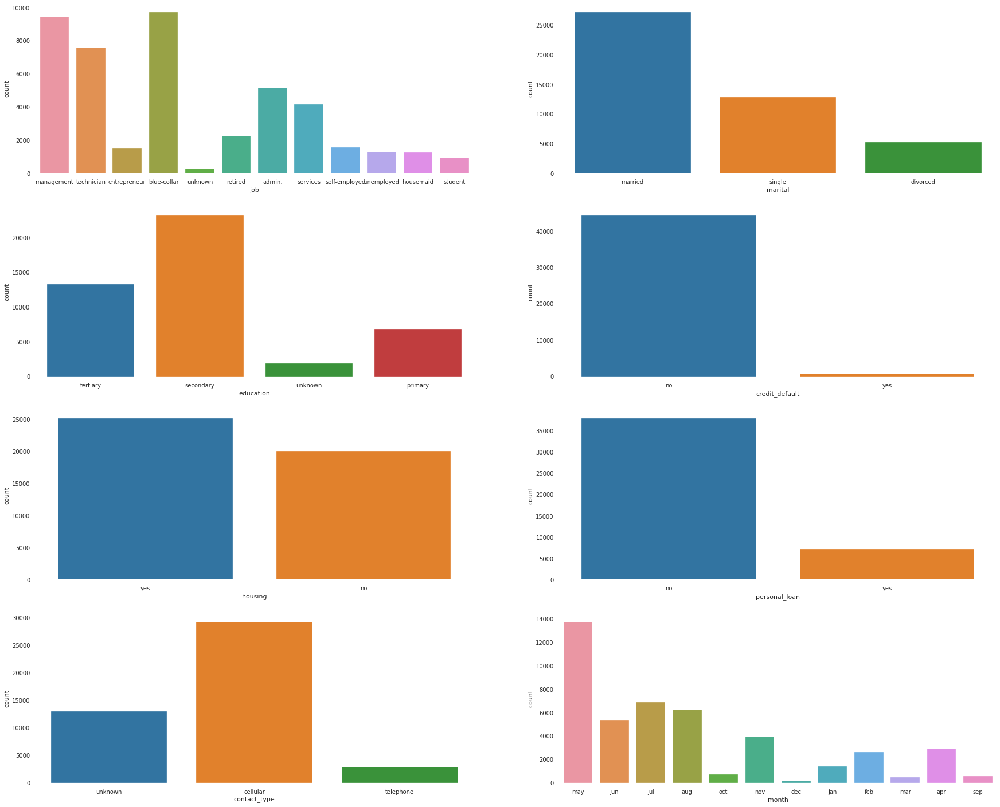

In [ ]:
column_countplot = dataFrame_object.columns
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(30,25))
for column,ax in zip(column_countplot[0:],axs.ravel()):
    # plt.figure(figsize=(12,8))
    sns.countplot(x=column,data=dataFrame_object,ax=ax)

From the count plot, below are the observations:



1.   Majority of the clients have completed their secondary education
2.   More than 90% of the costumers have no default credit history

1.   More than 50% of the customers have housing loan and almost very few customers have personal loan
2.   Majority of the customers use cellular type as a way of communication over telephone which makes sense and there are few customers where we are unsure about the type of communication they are using

1.   Most customers were contacted last during the month of May and followed by July and August
2.   Out of 45211 customers almost 70% of them are married and 20% are single and 10% are diversed

1.   Most of the customers are holding a blue-collar job followed by Management & Technician while the minority customers are students in the sample data and few of their professions are unknown









In [ ]:
# x = dataFrame.iplot(kind='pie', labels='job', values='target', title='Type of Jobs of clients', hoverinfo="target", hole=0.3, theme='white')
# x.show()

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



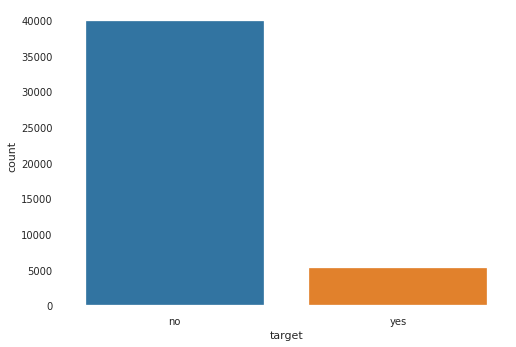

In [ ]:
sns.countplot(dataFrame['target'])

From the count plot it is evident that there are very less number of customers subscribed to term deposit which was below their expectation. They want to do some analysis and find out areas influencing the product purchase and build new initiatives to attract more number of customers

<Figure size 1080x1080 with 0 Axes>

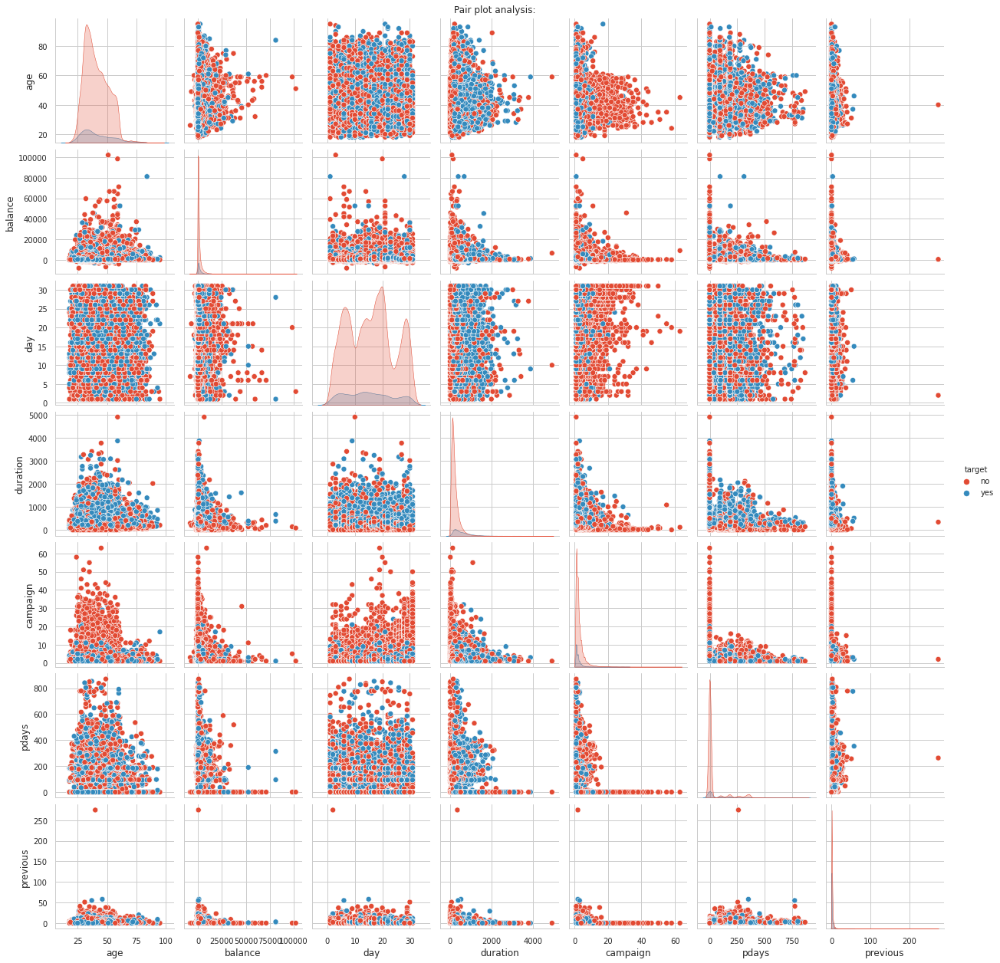

In [ ]:
# Pair plot analysis:

with plt.style.context('ggplot'):
    sns.set_style(style="whitegrid")
    fig = plt.figure(figsize=(15,15))
    sns.pairplot(data=dataFrame,diag_kind='kde', hue='target')
    plt.suptitle('Pair plot analysis:',x=0.5,y=1)
    plt.show()


previous_campaign  pdays                0.652739
pdays              previous_campaign    0.652739
                   previous             0.454820
previous           pdays                0.454820
                   previous_campaign    0.394581
previous_campaign  previous             0.394581
target             duration             0.394521
duration           target               0.394521
previous_campaign  target               0.246551
target             previous_campaign    0.246551
contact_type       pdays                0.244816
pdays              contact_type         0.244816
previous_campaign  contact_type         0.235399
contact_type       previous_campaign    0.235399
dtype: float64

,age,job,marital,education,credit_default,balance,housing,personal_loan,contact_type,day,month,duration,campaign,pdays,previous,previous_campaign,target
age,1.000000,0.059290,-0.126351,-0.165066,-0.017879,0.097783,-0.185513,-0.015655,-0.026221,-0.009120,0.092903,-0.004648,0.004760,-0.023758,0.001288,0.024445,0.025155
job,0.059290,1.000000,0.058577,-0.025516,-0.000691,0.016582,-0.149838,-0.023456,0.048014,-0.006677,0.012806,0.007040,-0.031597,-0.014989,0.001115,0.025692,0.060227
marital,-0.126351,0.058577,1.000000,0.082306,0.018404,-0.028172,-0.011671,-0.018526,0.017638,-0.005217,-0.044321,0.018834,-0.029294,0.020832,0.006876,0.008721,0.043846
education,-0.165066,-0.025516,0.082306,1.000000,-0.007522,0.041163,-0.022908,0.014705,0.140348,0.018659,0.061910,0.002353,-0.001087,0.007635,0.023633,0.034956,0.041634
credit_default,-0.017879,-0.000691,0.018404,-0.007522,1.000000,-0.066745,-0.006025,0.077234,-0.015404,0.009424,0.014989,-0.010021,0.016822,-0.029979,-0.018329,-0.036096,-0.022419
balance,0.097783,0.016582,-0.028172,0.041163,-0.066745,1.000000,-0.068768,-0.084350,0.027273,0.004503,0.094605,0.021560,-0.014578,0.003435,0.016674,0.035571,0.052838
housing,-0.185513,-0.149838,-0.011671,-0.022908,-0.006025,-0.068768,1.000000,0.041323,-0.188123,-0.027982,-0.173887,0.005075,-0.023599,0.124178,0.037076,0.000784,-0.139173
personal_loan,-0.015655,-0.023456,-0.018526,0.014705,0.077234,-0.084350,0.041323,1.000000,0.010873,0.011370,0.021638,-0.012412,0.009980,-0.022754,-0.011043,-0.043474,-0.068185
contact_type,-0.026221,0.048014,0.017638,0.140348,-0.015404,0.027273,-0.188123,0.010873,1.000000,0.027936,0.173779,0.020839,-0.019614,0.244816,0.147811,0.235399,0.148395
day,-0.009120,-0.006677,-0.005217,0.018659,0.009424,0.004503,-0.027982,0.011370,0.027936,1.000000,0.101989,-0.030206,0.162490,-0.093044,-0.051710,-0.070162,-0.028348


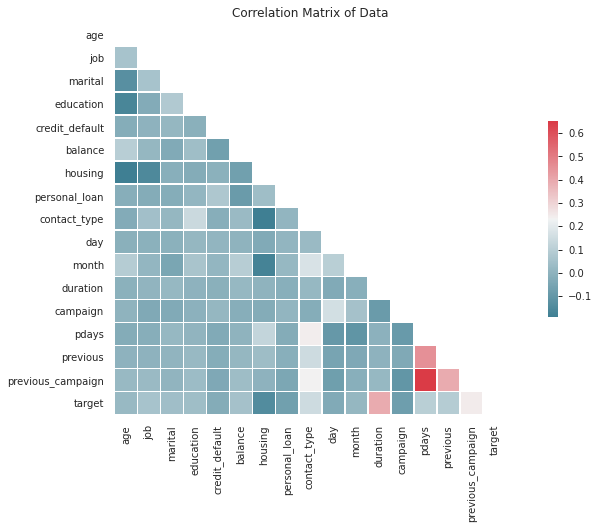

In [ ]:
# Heat Map to represent correlation among attributes:

# Correlation matrix for all variables
def correlation_matrix(df, threshold = 0.8):
    corr = df.corr()
    mask = np.zeros_like(corr, dtype = np.bool)
    mask[np.triu_indices_from(mask)] = True
    f, ax = plt.subplots(figsize = (15, 7.2))
    cmap = sns.diverging_palette(220, 10, as_cmap = True)
    sns.heatmap(corr, mask = mask, cmap = cmap, square = True, linewidths = .5, cbar_kws = {"shrink": .5})#, annot = True)
    ax.set_title('Correlation Matrix of Data')

    # Filter for correlation value greater than threshold
    sort = corr.abs().unstack()
    sort = sort.sort_values(kind = "quicksort", ascending = False)
    display(sort[(sort > threshold) & (sort < 1)])

correlation_matrix(dataFrame,threshold= 0.2)
dataFrame.corr()

Each attribute has different units so normalizing data doesn't make any sense because the scale between all the features matter. So lets standardize data such that the mean value is close to 0 and standard deviation 1



In [ ]:
# Heat Map to represent correlation among attributes:

plt.figure(figsize=(20,10))
ax = sns.heatmap(dataFrame.corr(), annot = True, fmt='.1g', linewidths = 0.01,center=1.5)
plt.title('Cross correlation between attributes')
plt.show()

Observations:



*   pdays and previous are postively correlated and it makes sense because from our analysis there are very few clients that were previously contacted and they wouldn't have contacted them before.


From the other attributes, there is no much collinearity observed between the independent variables so this may not lead to multi-collinearity issue. So we need not drop columns as such.


In [ ]:
# dummy_data = pd.get_dummies(data=dataFrame, columns=dataFrame_object.columns)
# dummy_data.dtypes
# 

In [ ]:
# Reference : https://medium.com/@rrfd/standardize-or-normalize-examples-in-python-e3f174b65dfc
# Standardization of dataset
# scalar = preprocessing.StandardScaler()
# scaled_df = scalar.fit_transform(dataFrame)
# scaled_df = pd.DataFrame(scaled_df, columns=columns)
# scaled_df

In [ ]:
profile = pandas_profiling.ProfileReport(dataFrame)
profile
# plot(dataFrame)
# dataFrame.dtypes

In [ ]:
#relationship b/w defaulters who had taken previous loan with the target (credit_default vs target & personal_loan vs target & housing_loan vs target)
# sns.jointplot(x='job', y='balance', data=dataFrame, kind="hex")


Few Interesting Observations from Interactions - Bivariate Analysis

1. This campaign is targetted between the age groups of 30-60. 

2.   People between the age 30-40 years have more bank balance among all the other customers (balance vs age)
3. Majority of the targetted customers are between 30-40 years (since they have higher bank balance (age vs balance) and none of them were contacted before (previous vs balance)

4.   Those who have bank balance are contacted almost everyday in a week (balance vs day)
5.   On an average most of the customers are 
contacted during the first and the mid week alone and none of them were troubled during the end of month (day vs campaign)

6.   Most of the customers in the sample were not contacted before





Now based on assumptions lets do some Statistical Analysis



*   Assumption 1 - People who purchased product have more than 40 years of age on an average
*   Assumption 2 - Assumption 4 - People having blue collar jobs have higher bank balance.

*   Assumption 3 - People with Blue collar jobs purchased the product
*   Assumption 4 - People with more balance were contacted frequently have purchased the product

*   Assumption 5 - Customers who were contacted during the month of May tend to purchase the product
*   Assumption 6 - None of the people who had previous loan or housing loan could have brought the product






In [ ]:
# sns.countplot(x='marital', data=dataFrame, hue='target')

In [ ]:

pie_chart = px.pie(data_frame=dataFrame, values='age', names='job', color='job', hover_name='age', title='Job Profiles of Customers', template='presentation', width=800, height=600,hole=0.5)
pio.show(pie_chart)

From the analysis customers who have blue-collar jobs have higher bank balance

###Assumption -3 - Blue Collar Jobs would have purchased the product more when compared to customers with other professions

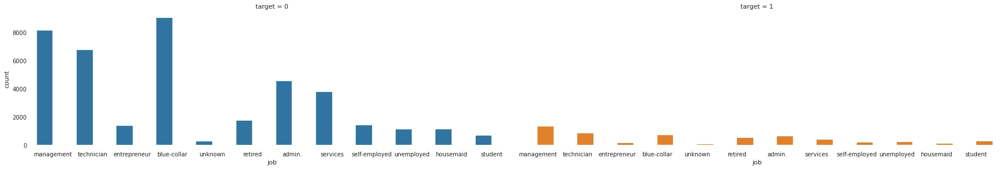

In [ ]:
g = sns.catplot(x="job", hue="target", col="target",
                data=dataFrame, kind="count",
                height=4, aspect=3, edgecolor=sns.color_palette("Greens", 3))

Our assumption was wrong here. From the plots we could see that majority of the **Blue-Collar** profession customers have not purchased the product and people with **Management** profession have purchased the product

###From the analysis overall, below are the few points that can be suggested, there are chances that the bank may improve their sales of new product



1.   Try to target customers whose age group ranges from 25-45 years
2.   Trying to contact more customers during all months and Feb, April, June, July, September in specific 

1.   Introduce new marketting strategies like advertising through web, social media and it may make reach larger people as everything is digital 
2.   Target not only the people who have higher bank balance, rather try to introduce this to all categories which may result in the future sales improvement





